In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier#, XGBRFClassifier
import shap

In [2]:
shap.initjs()
pd.plotting.register_matplotlib_converters()
sns.set(rc={"font.size":16,"axes.titlesize":20,"axes.labelsize":20})

In [3]:
font = {'size'   : 18}
plt.rc('font', **font)
plt.rc('axes', labelsize=18)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=9)    # fontsize of the tick labels
plt.rc('ytick', labelsize=9) 

In [4]:
dataf1 = pd.read_csv('/Users/adibanpa/Dropbox/ML/engineered_data_7.csv')
dataf1 = dataf1.drop(axis=1, columns='Unnamed: 0')
dataf2 = pd.read_csv('/Users/adibanpa/Dropbox/ML/engineered_data_7.csv')
dataf2 = dataf2.drop(axis=1, columns='Unnamed: 0')

dataf1 = dataf1.drop(columns = ['deep10', 'deep10_mean', 'deep10_min', 'deep10_max', 
                                'deep10_var' ,'deep10_med', 'deep10_std', 'deep10_kurt', 
                                'deep10_skew', 'deep2', 'deep2_mean', 'deep2_min', 
                                'deep2_max', 'deep2_var', 'deep2_med', 'deep2_std', 
                                'deep2_kurt', 'deep2_skew', 'deep4', 'deep4_mean', 
                                'deep4_min', 'deep4_max', 'deep4_var', 'deep4_med',
                                'deep4_std','deep4_kurt', 'deep4_skew','deep6', 
                                'deep6_mean', 'deep6_min','deep6_max', 'deep6_var', 
                                'deep6_med', 'deep6_std','deep6_kurt', 'deep6_skew',])

dataf2 = dataf2.drop(columns = ['deep10', 'deep10_mean', 'deep10_min', 'deep10_max', 
                                'deep10_var' ,'deep10_med', 'deep10_std', 'deep10_kurt', 
                                'deep10_skew', 'deep2', 'deep2_mean', 'deep2_min', 
                                'deep2_max', 'deep2_var', 'deep2_med', 'deep2_std', 
                                'deep2_kurt', 'deep2_skew', 'deep4', 'deep4_mean', 
                                'deep4_min', 'deep4_max', 'deep4_var', 'deep4_med',
                                'deep4_std','deep4_kurt', 'deep4_skew','deep6', 
                                'deep6_mean', 'deep6_min','deep6_max', 'deep6_var', 
                                'deep6_med', 'deep6_std','deep6_kurt', 'deep6_skew',])

In [5]:
dataf2.describe()

,x,y,ewdeep10,ewdeep10_mean,ewdeep10_min,ewdeep10_max,ewdeep10_var,ewdeep10_med,ewdeep10_std,ewdeep10_kurt,...,rtp_tilt_skew,anasig,anasig_mean,anasig_min,anasig_max,anasig_var,anasig_med,anasig_std,anasig_kurt,anasig_skew
count,38731.000000,38731.000000,38731.000000,38731.000000,38731.0,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,...,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000,38731.000000
mean,88.892567,109.796674,0.067336,0.067443,0.0,0.288683,0.048474,0.004402,0.115597,-1.316496,...,0.049609,0.207503,0.207438,0.057079,0.853626,0.119015,0.149690,0.168572,3.326719,1.511758
std,50.156917,63.940193,0.250607,0.120086,0.0,0.453156,0.082253,0.062440,0.187382,6.479091,...,0.372436,0.413848,0.229257,0.034544,1.390386,0.534049,0.124672,0.301001,5.292816,1.034688
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,-3.000000,...,-1.532649,0.011142,0.021072,0.011142,0.034145,0.000020,0.017552,0.004435,-1.473779,-1.028298
25%,46.000000,55.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,-3.000000,...,-0.198341,0.073266,0.095971,0.033501,0.229500,0.001566,0.080902,0.039570,0.019034,0.772283
50%,89.000000,110.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,-3.000000,...,0.037550,0.119360,0.147071,0.050306,0.381934,0.005003,0.120220,0.070735,1.414091,1.295830
75%,132.000000,165.000000,0.000000,0.093750,0.0,1.000000,0.084961,0.000000,0.291481,-1.464009,...,0.284256,0.203364,0.230838,0.073071,0.781393,0.023007,0.177937,0.151682,4.654364,2.064002
max,175.000000,223.000000,1.000000,0.609375,0.0,1.000000,0.250000,1.000000,0.500000,59.015873,...,2.467335,9.859165,2.874813,0.633147,9.859165,6.833376,2.226281,2.614073,52.663400,7.239656


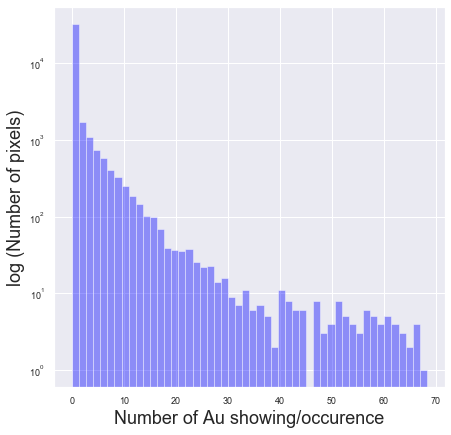

In [6]:
# Plot distribution of gold        
f_au, ax_au = plt.subplots(figsize=(7, 7))
ax_au.set(yscale="log")
sns.distplot(dataf1['au'], kde = False, color="blue")
ax_au.set(xlabel='Number of Au showing/occurence', 
          ylabel='log (Number of pixels)')
f_au.savefig(fname = r'img\numocc.png', dpi=100)

In [6]:
mainkeys = dataf1.keys()[2::9]
maindf = dataf1.iloc[:, 2::9]

In [7]:
maindf.keys()

Index(['ewdeep10', 'ewdeep2', 'ewdeep4', 'ewdeep6', 'nsdeep10', 'nsdeep2',
       'nsdeep4', 'nsdeep6', 'bouguer', 'fault10', 'fault2', 'fault4',
       'fault6', 'au', 'psgrav', 'psg_tilt', 'rtp', 'rtp_tilt', 'anasig'],
      dtype='object')

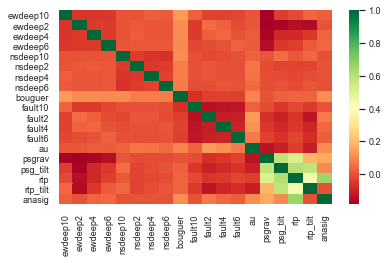

In [9]:
corrmat = maindf.corr()
top_corr_features = corrmat.index
plt.figure()
#plot heat map
# g=sns.heatmap(dataf2[top_corr_features].corr(),annot=True,cmap="RdYlGn")
g=sns.heatmap(maindf[top_corr_features].corr(),annot=False,cmap="RdYlGn")
plt.tight_layout()
plt.savefig('img/heatmap.pdf', dpi=100)

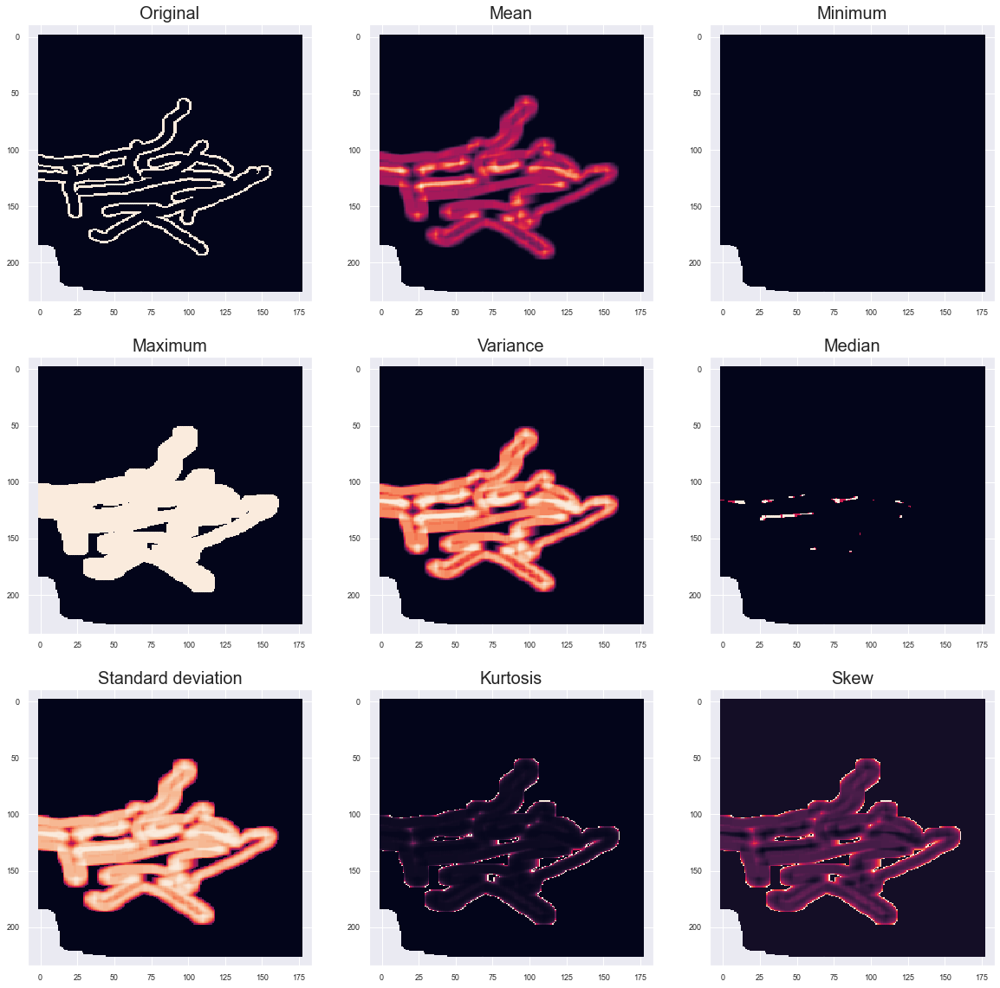

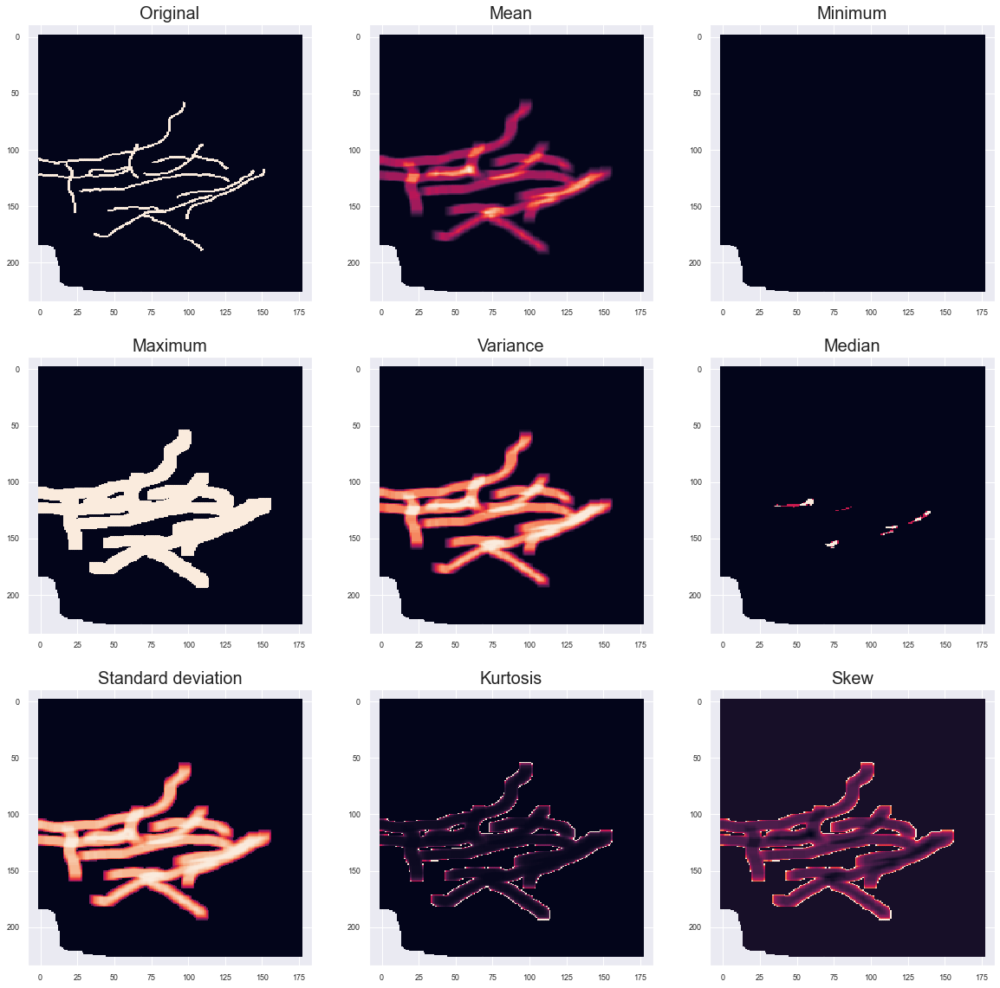

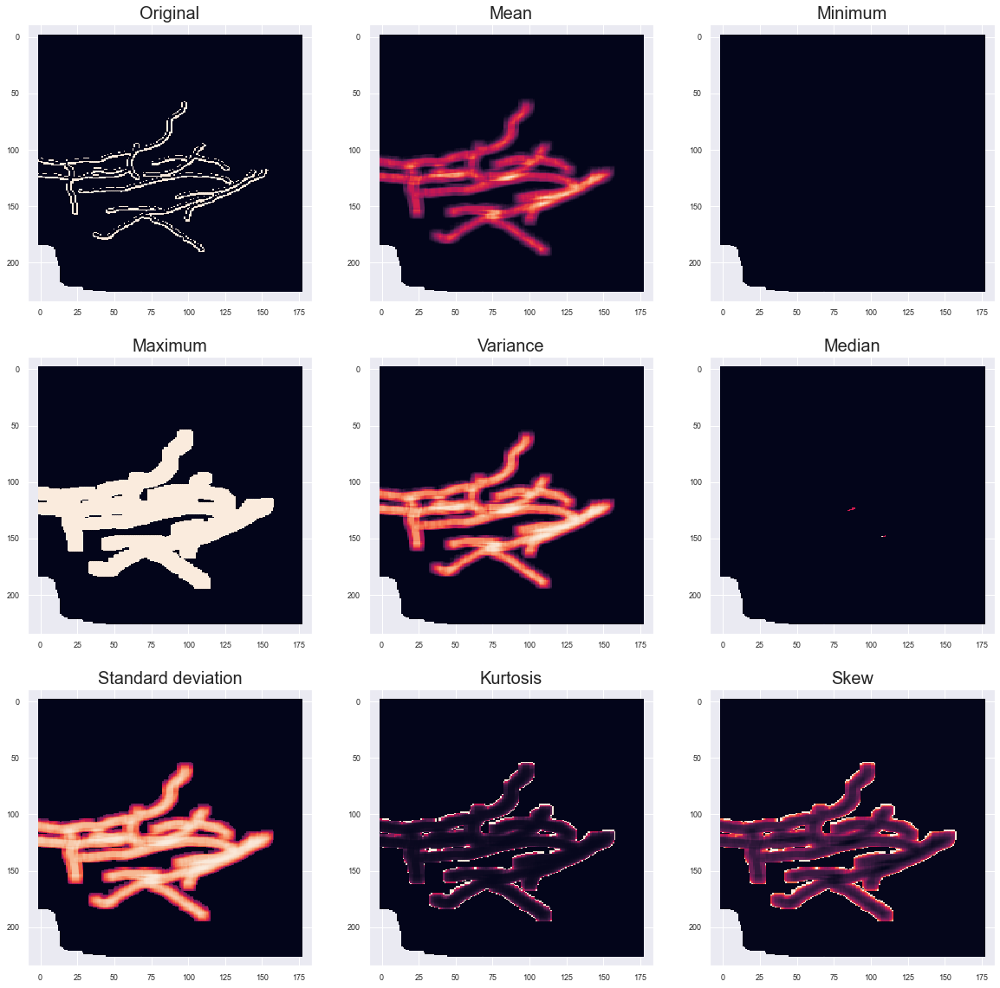

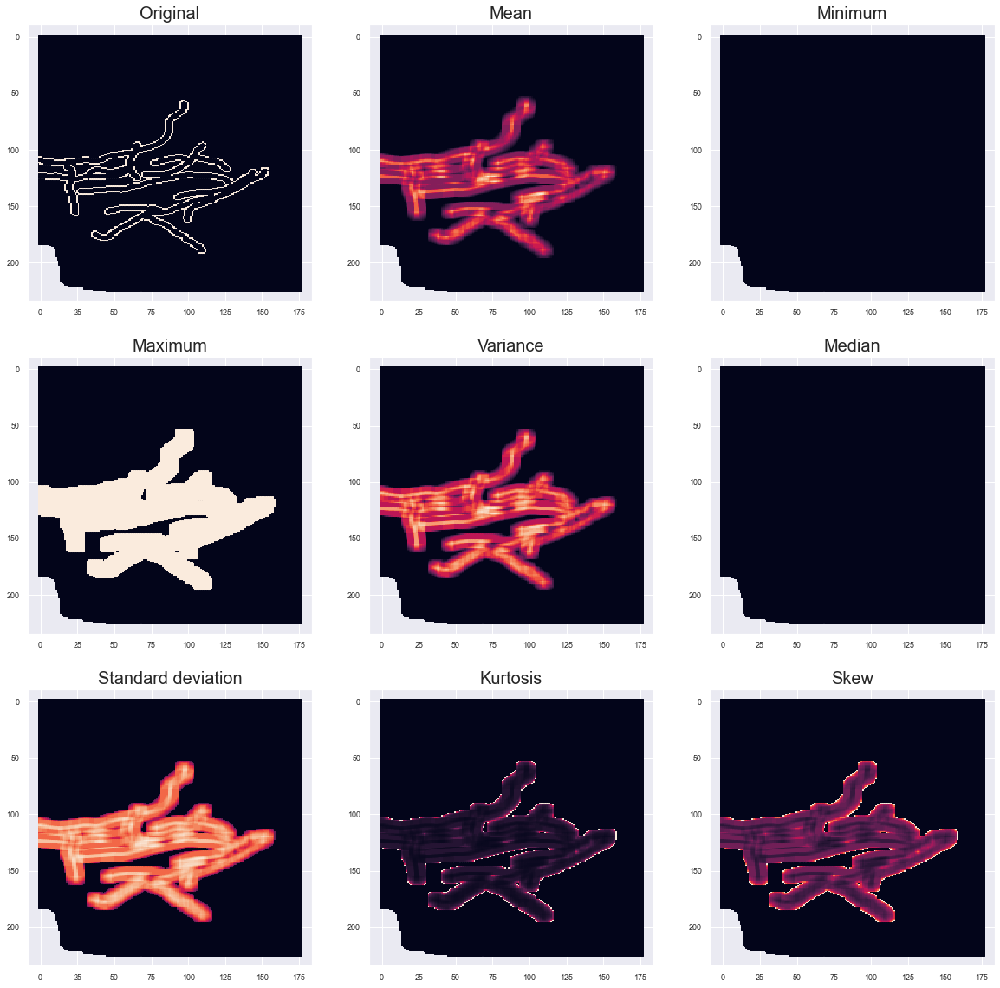

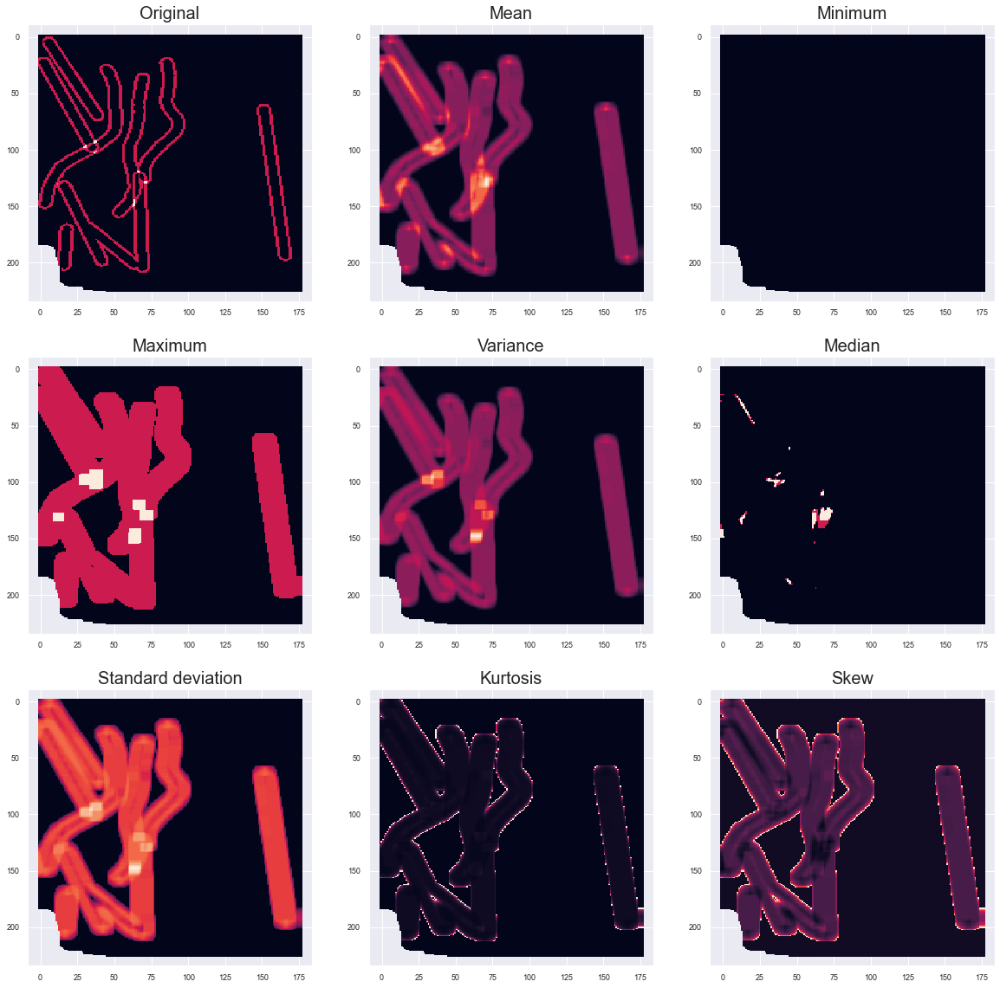

...

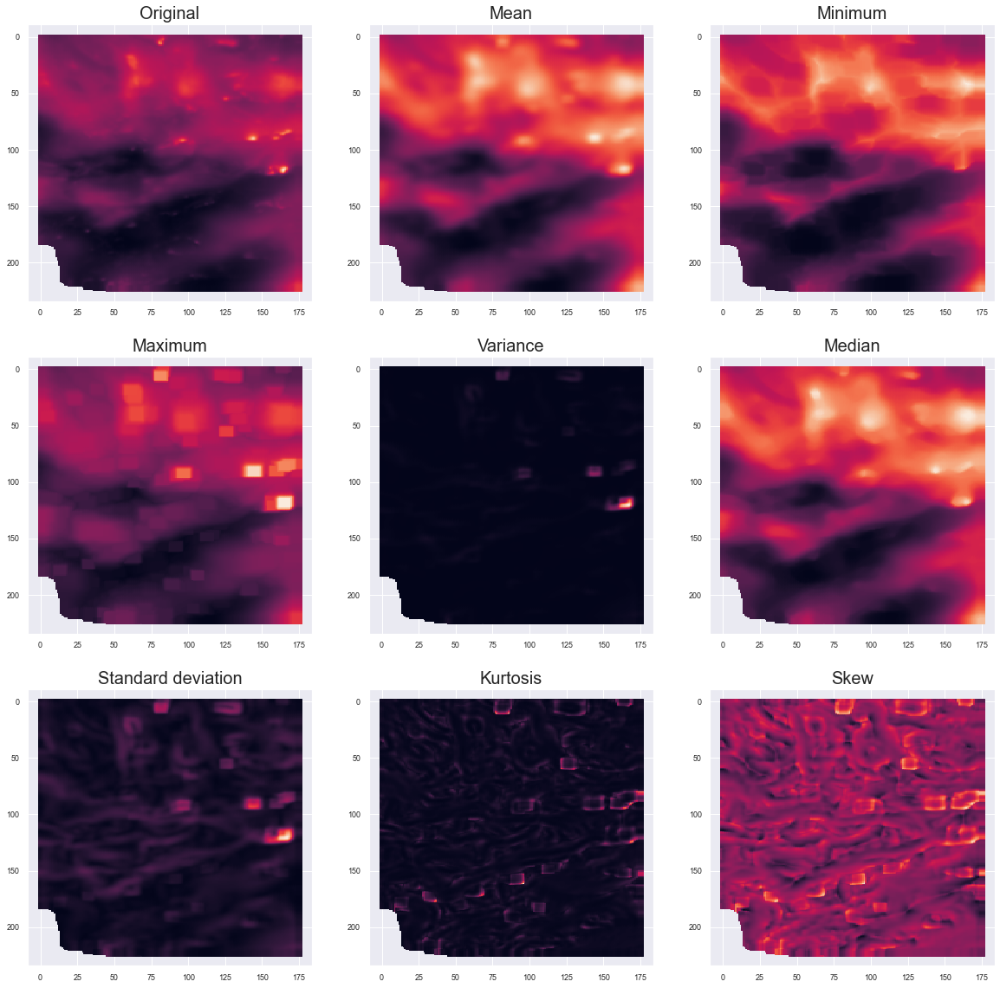

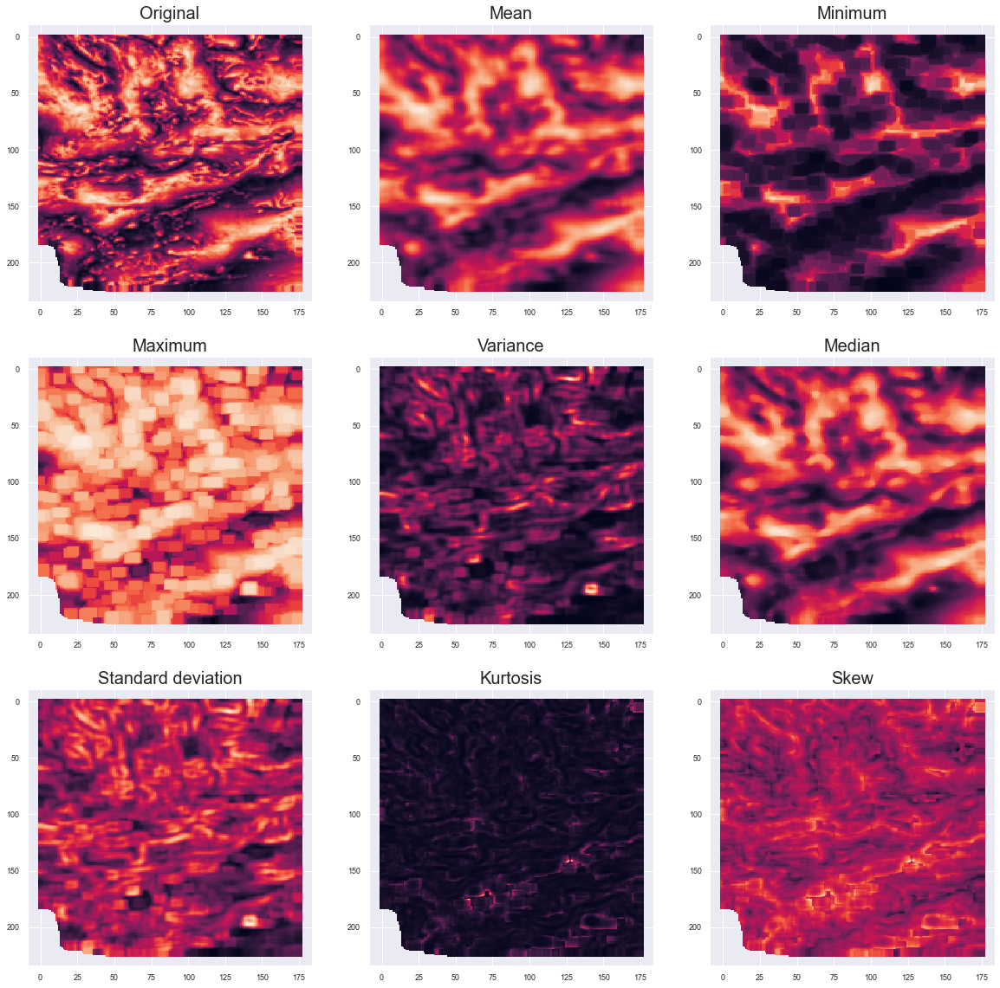

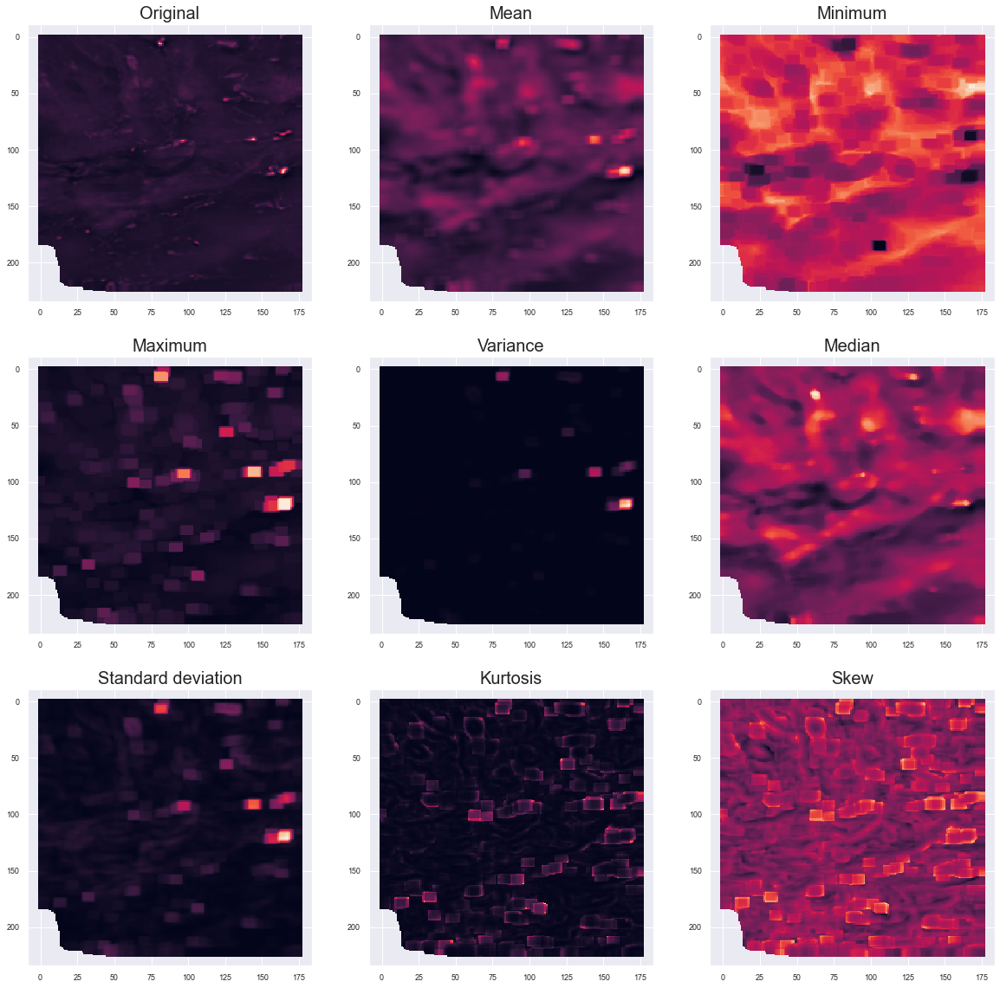

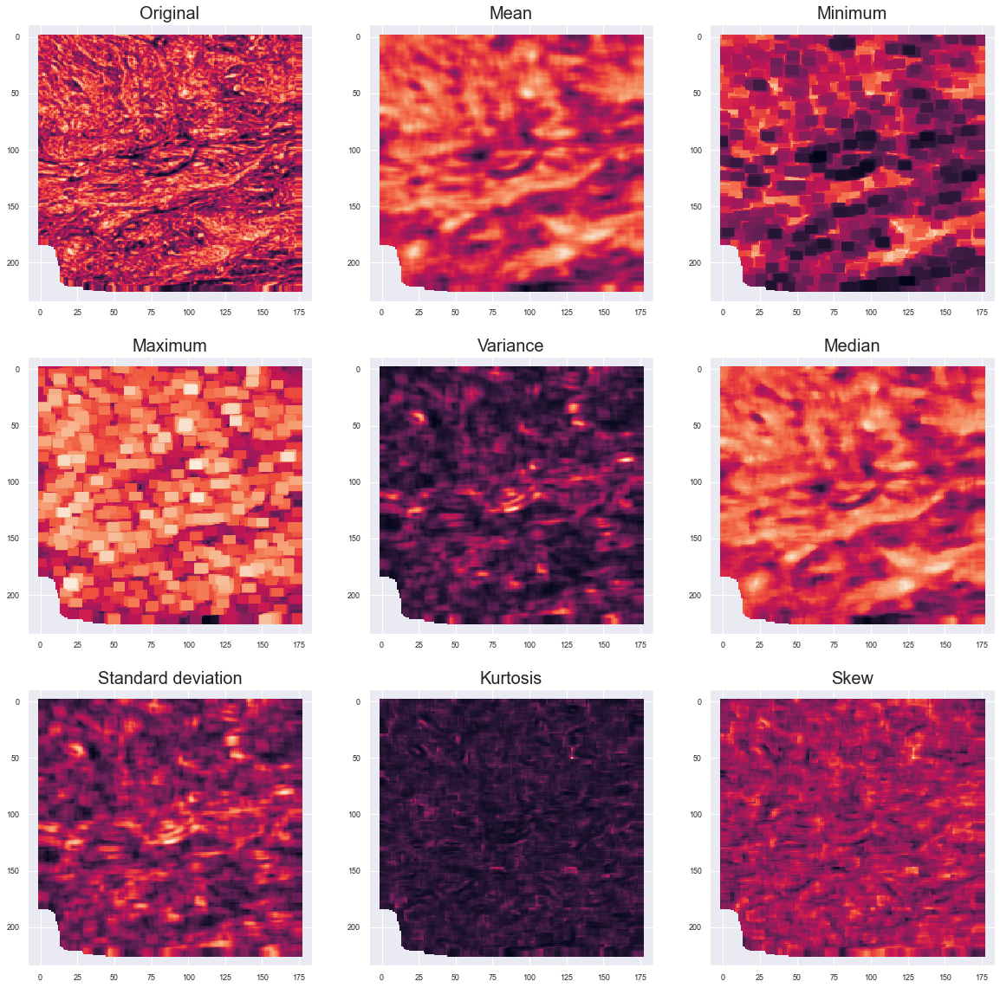

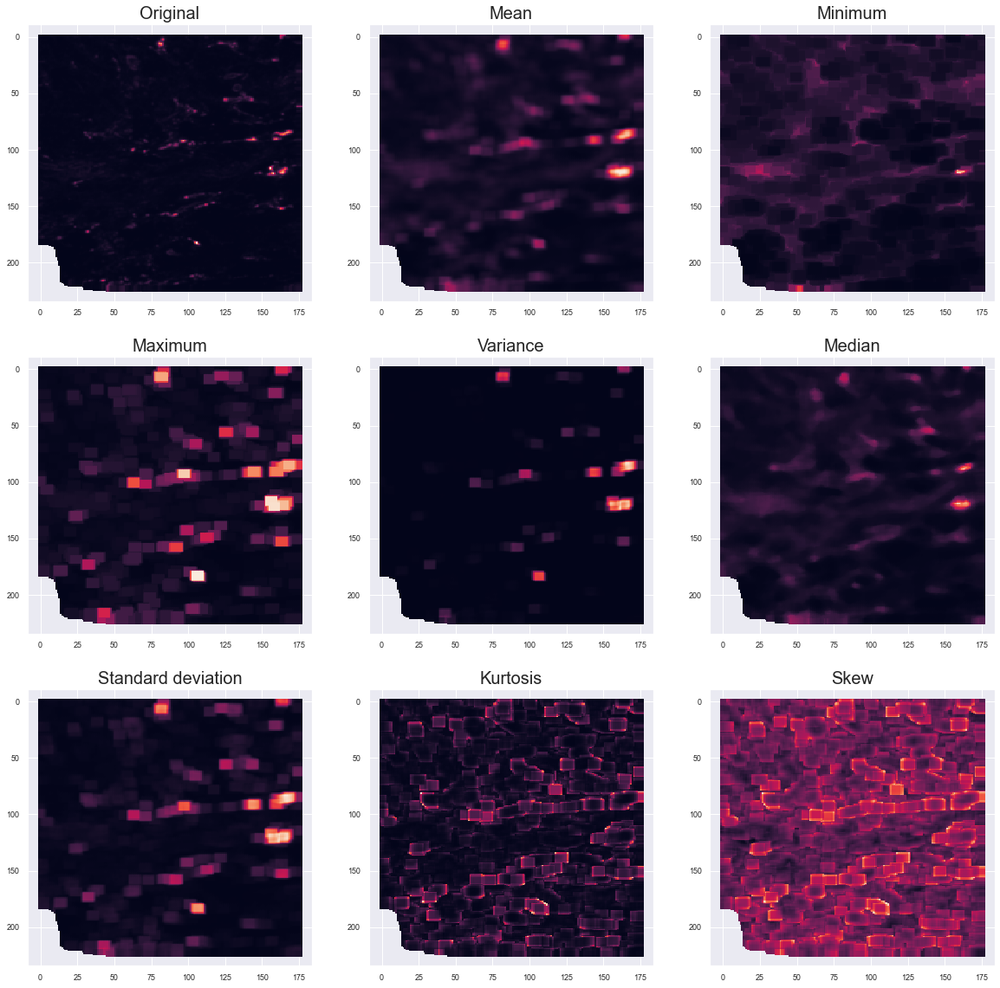

In [19]:
for i, key in enumerate(mainkeys[::]):
    f = plt.figure(figsize=(20,20))
    # plt.suptitle('Analytical Signal')
    ax1 = f.add_subplot(331)
    ax1.set_title('Original')
    ax1.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}'.format(key)], marker='s')
    ax1.invert_yaxis()

    ax2 = f.add_subplot(332)
    ax2.set_title('Mean')
    ax2.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_mean'.format(key)], marker='s')
    ax2.invert_yaxis()

    ax3 = f.add_subplot(333)
    ax3.set_title('Minimum')
    ax3.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_min'.format(key)], marker='s')
    ax3.invert_yaxis()

    ax4 = f.add_subplot(334)
    ax4.set_title('Maximum')
    ax4.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_max'.format(key)], marker='s')
    ax4.invert_yaxis()

    ax5 = f.add_subplot(335)
    ax5.set_title('Variance')
    ax5.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_var'.format(key)], marker='s')
    ax5.invert_yaxis()

    ax6 = f.add_subplot(336)
    ax6.set_title('Median')
    ax6.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_med'.format(key)], marker='s')
    ax6.invert_yaxis()

    ax7 = f.add_subplot(337)
    ax7.set_title("Standard deviation")
    ax7.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_std'.format(key)], marker='s')
    ax7.invert_yaxis()

    ax8 = f.add_subplot(338)
    ax8.set_title('Kurtosis')
    ax8.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_kurt'.format(key)], marker='s')
    ax8.invert_yaxis()

    ax9 = f.add_subplot(339)
    ax9.set_title('Skew')
    ax9.scatter(x=dataf1['x'], y=dataf1['y'], c = dataf1['{}_skew'.format(key)], marker='s')
    ax9.invert_yaxis()

#     plt.tight_layout()
    f.savefig('img/layer_{}.png'.format(key), dpi=100)
    
# maindf.plot(subplots=True, layout=(31,9))

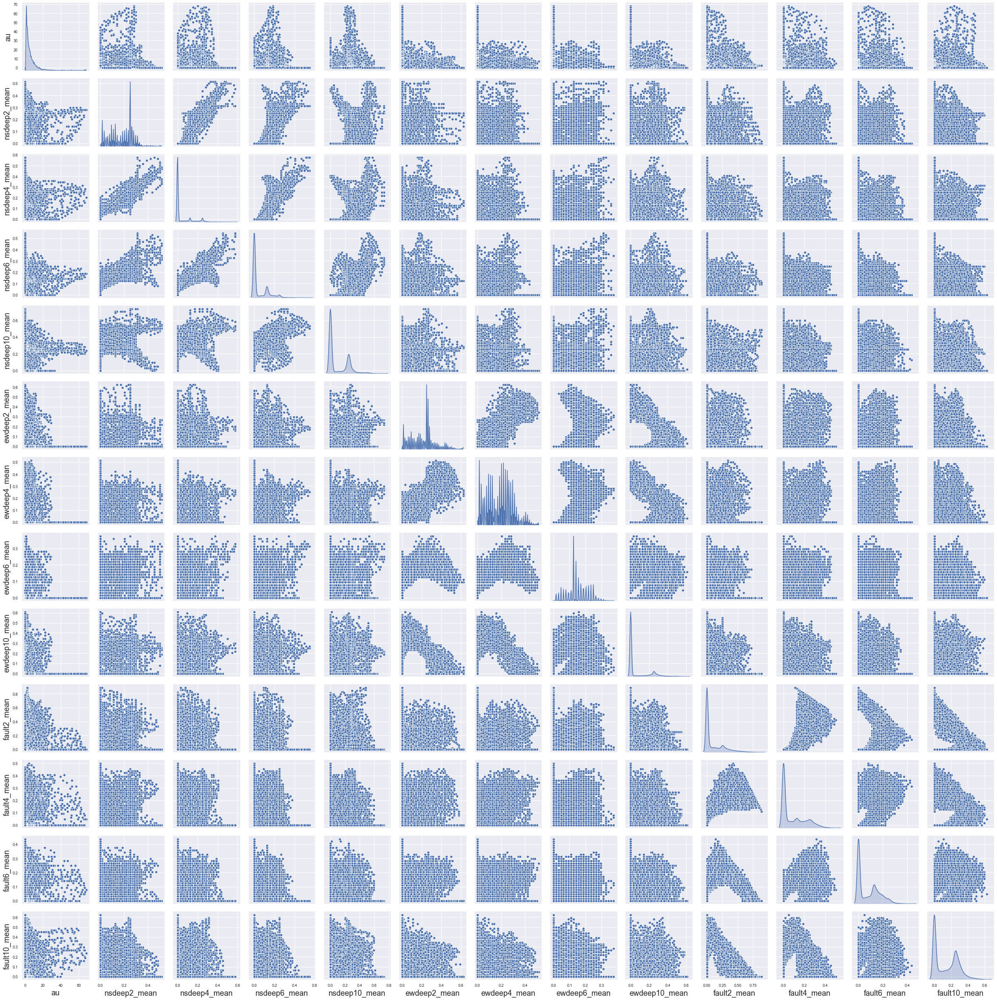

In [12]:
g2 = sns.pairplot(dataf1, vars = ['au', 'nsdeep2_mean','nsdeep4_mean', 
                                  'nsdeep6_mean', 'nsdeep10_mean', 
                                  'ewdeep2_mean', 'ewdeep4_mean',
                                  'ewdeep6_mean', 'ewdeep10_mean',
                                  'fault2_mean', 'fault4_mean',
                                  'fault6_mean', 'fault10_mean'],
                                  diag_kind = "kde", corner = False)
# g2.savefig('img/pairplot_struc_mean.png', dpi=100)

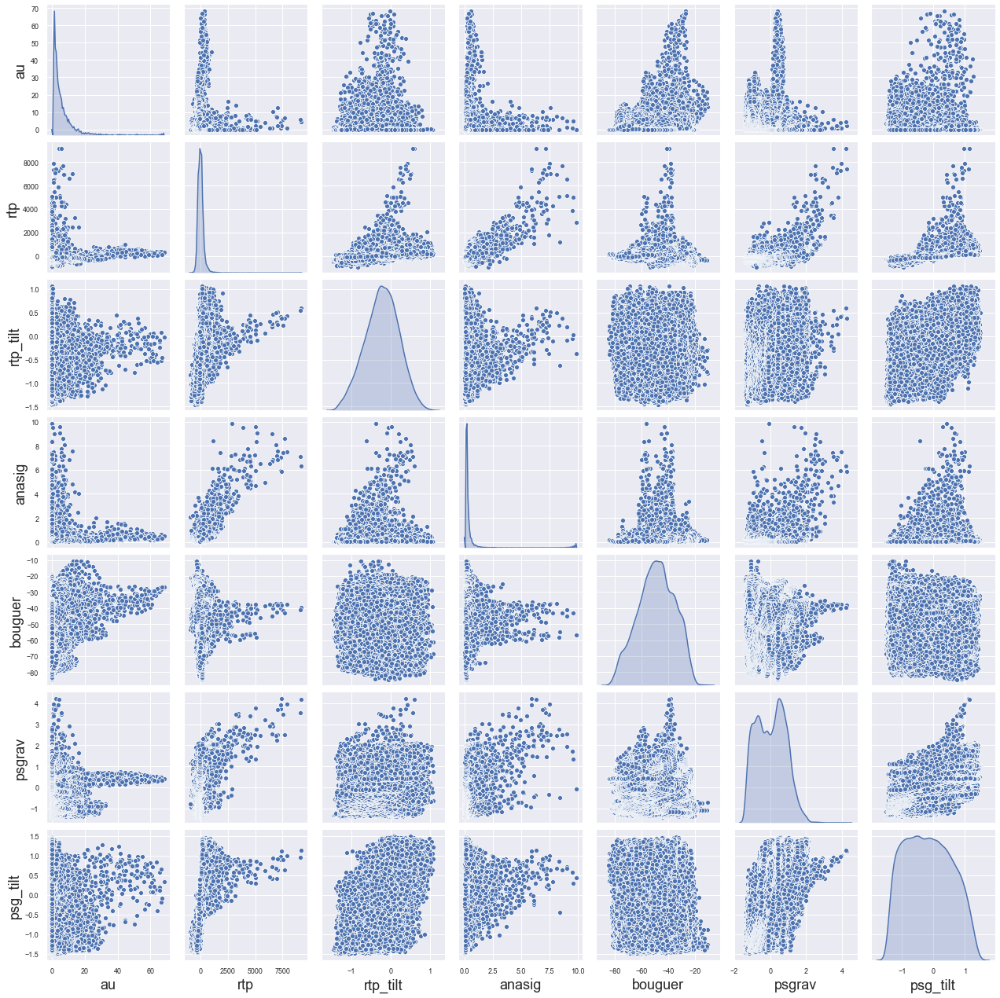

In [13]:
g3 = sns.pairplot(dataf1, vars = ['au', 'rtp','rtp_tilt', 
                                  'anasig', 'bouguer', 
                                  'psgrav', 'psg_tilt',
                                  ],
                                  diag_kind = "kde", corner = False)
g3.savefig('img/pairplot_gphys.png', dpi=100)